In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV

# 1st Dataset

### Breast Cancer Data
   
####   Data Description
   1. Class: no-recurrence-events, recurrence-events
   2. age: 10-19, 20-29, 30-39, 40-49, 50-59, 60-69, 70-79, 80-89, 90-99.
   3. menopause: lt40, ge40, premeno.
   4. tumor-size: 0-4, 5-9, 10-14, 15-19, 20-24, 25-29, 30-34, 35-39, 40-44,
                  45-49, 50-54, 55-59.
   5. inv-nodes: 0-2, 3-5, 6-8, 9-11, 12-14, 15-17, 18-20, 21-23, 24-26,
                 27-29, 30-32, 33-35, 36-39.
   6. node-caps: yes, no.
   7. deg-malig: 1, 2, 3.
   8. breast: left, right.
   9. breast-quad: left-up, left-low, right-up,	right-low, central.
  10. irradiat:	yes, no.

In [2]:
breast_cancer_df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer/breast-cancer.data",
             names = ["Class","Age","Menopause","Tumor-size","Inv-nodes","Node-caps","deg-malig","Breast","Breast-quad","Irradiat"])

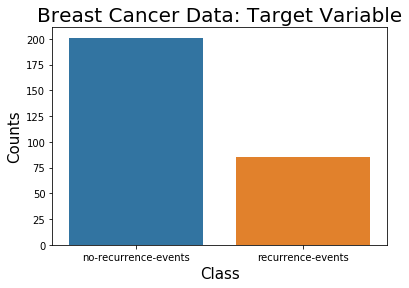

In [3]:
sns.countplot(breast_cancer_df.Class)
plt.xlabel("Class",fontsize=15)
plt.ylabel("Counts",fontsize = 15)
plt.title("Breast Cancer Data: Target Variable",fontsize=20)
plt.show()

Data is Imablanced from the above graph we can see that.

In [111]:
breast_cancer_df.shape # 286 rows and 10 features we have

(286, 10)

In [5]:
breast_cancer_df.isna().sum() # Checking Na Values

Class          0
Age            0
Menopause      0
Tumor-size     0
Inv-nodes      0
Node-caps      0
deg-malig      0
Breast         0
Breast-quad    0
Irradiat       0
dtype: int64

In [7]:
for feature in breast_cancer_df.columns:
    print(feature +" = "+str(breast_cancer_df[feature].nunique()),end="\n") # Checking total unique values in each variable

Class = 2
Age = 6
Menopause = 3
Tumor-size = 11
Inv-nodes = 7
Node-caps = 3
deg-malig = 3
Breast = 2
Breast-quad = 6
Irradiat = 2


In [9]:
for feature in breast_cancer_df.columns: # Label Encoding
    coder = LabelEncoder()
    breast_cancer_df[feature]=coder.fit_transform(breast_cancer_df[feature])

In [10]:
#################### Over Sampling ###########################
# class count
class_count_0, class_count_1 = breast_cancer_df['Class'].value_counts()
# Separate class
class_0 = breast_cancer_df[breast_cancer_df['Class'] == 0]
class_1 = breast_cancer_df[breast_cancer_df['Class'] == 1]# print the shape of the class
print('class 0:', class_0.shape)
print('class 1:', class_1.shape)

class 0: (201, 10)
class 1: (85, 10)


total class of 1 and 0: 1    201
0    201
Name: Class, dtype: int64


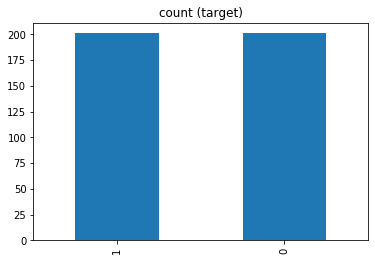

In [11]:
class_1_over = class_1.sample(class_count_0, replace=True)

test_over = pd.concat([class_1_over, class_0], axis=0)

print("total class of 1 and 0:",test_over['Class'].value_counts())# plot the count after under-sampeling
test_over['Class'].value_counts().plot(kind='bar', title='count (target)')

### Modeling : Random Forest on the Base Dataset

In [12]:
X = test_over.drop('Class',1) # Independent Variables
y = test_over.Class # Dependent Variables

In [13]:
scaler = StandardScaler() # Scaling feature

X = scaler.fit_transform(X)

In [14]:
# Splitting into training and testing data
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.33, random_state=42)

In [15]:
rf_model = RandomForestClassifier(class_weight="balanced",random_state=40) # Random Forest Classifier

In [16]:
rf_model.fit(X_train,y_train) # Fitting the Model

D:\Anaconda\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=40, verbose=0, warm_start=False)

In [17]:
y_pred = rf_model.predict(X_test) # Predicting on test dataset

In [18]:
print(classification_report(y_test,y_pred)) # Classification report

              precision    recall  f1-score   support

           0       0.81      0.73      0.77        64
           1       0.77      0.84      0.81        69

    accuracy                           0.79       133
   macro avg       0.79      0.79      0.79       133
weighted avg       0.79      0.79      0.79       133



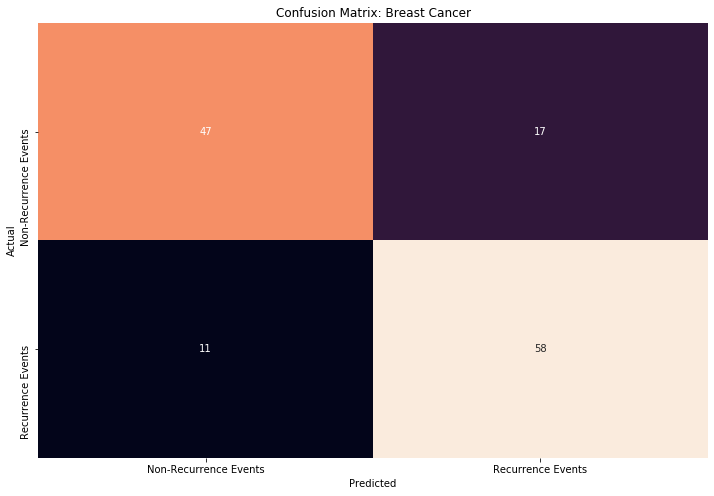

In [19]:
plt.figure(figsize=(12,8))
sns_plot = sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,cbar=False,xticklabels=['Non-Recurrence Events','Recurrence Events'],yticklabels=['Non-Recurrence Events','Recurrence Events'])
plt.title("Confusion Matrix: Breast Cancer")
plt.xlabel("Predicted")
plt.ylabel("Actual")
fig = sns_plot.get_figure()
fig.savefig("output.png")
plt.show()

In [20]:
print(confusion_matrix(y_test,y_pred)) # Confusion Matrix

[[47 17]
 [11 58]]


In [21]:
print(accuracy_score(y_test,y_pred)) # Test Accuracy

0.7894736842105263


In [22]:
rf_model.score(X_train,y_train) # Train Accuracy

0.9851301115241635

In [23]:
def evaluate_model(y_pred, probs,train_predictions, train_probs,output):
    """Function for calculating AUC and ROC curve"""
    baseline = {}
    baseline['recall']=recall_score(y_test,
                    [1 for _ in range(len(y_test))])
    baseline['precision'] = precision_score(y_test,
                    [1 for _ in range(len(y_test))])
    baseline['roc'] = 0.5
    results = {}
    results['recall'] = recall_score(y_test, y_pred)
    results['precision'] = precision_score(y_test, y_pred)
    results['roc'] = roc_auc_score(y_test, probs)
    train_results = {}
    train_results['recall'] = recall_score(y_train,       train_predictions)
    train_results['precision'] = precision_score(y_train, train_predictions)
    train_results['roc'] = roc_auc_score(y_train, train_probs)
    for metric in ['recall', 'precision', 'roc']:  
          print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
     # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(y_test, [1 for _ in range(len(y_test))])
    model_fpr, model_tpr, _ = roc_curve(y_test, probs)
    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate');
    plt.ylabel('True Positive Rate'); plt.title(f'ROC Curves {output}');
    plt.savefig(output+'.jpg')
    plt.show()


Recall Baseline: 1.0 Test: 0.84 Train: 1.0
Precision Baseline: 0.52 Test: 0.77 Train: 0.97
Roc Baseline: 0.5 Test: 0.86 Train: 1.0


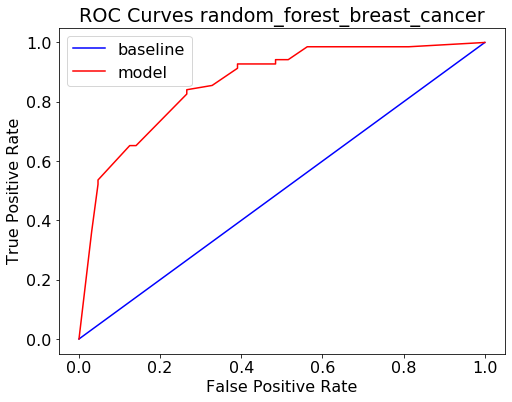

In [24]:
train_probs = rf_model.predict_proba(X_train)[:,1] 
probs = rf_model.predict_proba(X_test)[:,1]
train_predictions = rf_model.predict(X_train)

evaluate_model(y_pred,probs,train_predictions,train_probs,"random_forest_breast_cancer") # Auc and ROC Curve

### Decision Tree on Probablities

In [25]:
X_train_new = pd.DataFrame(X_train,columns=test_over.drop("Class",1).columns) #New Data Preparation
X_test_new = pd.DataFrame(X_test,columns=test_over.drop("Class",1).columns) # For test 

In [26]:
pred_prob = rf_model.predict_proba(X_train_new) # Calculating the Probabilities

In [27]:
# Creating New Target Variables for Multiclass Decision Tree
X_train_new['class_0'] =pred_prob[:,0]
X_train_new['class_1'] =pred_prob[:,1]
X_train_new['new_y'] = X_train_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)
X_train_new.drop(['class_0','class_1'],1,inplace=True)
pred_prob = rf_model.predict_proba(X_test)

In [28]:
d_tree = DecisionTreeClassifier() # Decision Tree Classifier

In [29]:
# Data Preparation for Test Data
X_test_new['class_0'] =pred_prob[:,0]
X_test_new['class_1'] =pred_prob[:,1]
X_test_new['new_y'] = X_test_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)
X_test_new.drop(['class_0','class_1'],1,inplace=True)

# Label Encoding on training and testing data
for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_train_new[feature]=coder.fit_transform(X_train_new[feature])

for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_test_new[feature]=coder.fit_transform(X_test_new[feature])

### Feature Scaling for training and testing data
scaler = StandardScaler()

X = scaler.fit_transform(X_train_new.drop('new_y',1))

d_tree.fit(X,X_train_new.new_y) ## Fitting Decision tree classifier

scaler = StandardScaler()

x = scaler.fit_transform(X_test_new.drop('new_y',1))

d_pred = d_tree.predict(x) # Predicting Decision Tree Classifier

print(classification_report(X_test_new.new_y,d_pred)) # Classification Report of New Multiclass CLassifier

              precision    recall  f1-score   support

           0       0.73      1.00      0.84        27
           1       0.00      0.00      0.00        12
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00        13
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         5
           9       0.00      0.00      0.00         8
          10       0.00      0.00      0.00         1
          11       0.00      0.00      0.00         1
          12       0.25      0.40      0.31         5
          13       0.00      0.00      0.00         1
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         6
          17       0.00    

D:\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [30]:
accuracy_score(X_test_new.new_y.values,d_pred) # Accuracy of multiclass

0.3007518796992481

In [31]:
d_tree.score(X,X_train_new.new_y)

1.0

In [32]:
## Parameters for Hyper Parameter Tunning
criterion=['gini', 'entropy']
max_depth=[i for i in range (2,50,5)]
min_samples_split=[i for i in range (2,50,5)]
min_samples_leaf=[i for i in range (2,20,2)]
param_grid={'max_depth':max_depth,
            'min_samples_split':min_samples_split,
           'min_samples_leaf':min_samples_leaf,
           'criterion':criterion}

#### Hyper Parameter tunning

In [34]:
grid=GridSearchCV(DecisionTreeClassifier(),param_grid,n_jobs=-1,cv=25,verbose=200) # Grid Search CV for Tunning
grid.fit(X,X_train_new.new_y)

D:\Anaconda\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=25.
  % (min_groups, self.n_splits)), Warning)


Fitting 25 folds for each of 1800 candidates, totalling 45000 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickl

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).


Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    3.3s

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dty

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pick

[Parallel(n_jobs=-1)]: Done 516 tasks      | elapsed:    4.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 724 tasks      | elapsed:    4.2s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,

[Parallel(n_jobs=-1)]: Done 880 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed:    4.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling a

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).[Parallel(n_jobs=-1)]: Done 1192 tasks      | elapsed:    4.8s

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pick

[Parallel(n_jobs=-1)]: Done 1868 tasks      | elapsed:    5.8s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (sh

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pick

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int3

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pick

[Parallel(n_jobs=-1)]: Done 3012 tasks      | elapsed:    7.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(

[Parallel(n_jobs=-1)]: Done 3220 tasks      | elapsed:    7.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 3428 tasks      | elapsed:    8.1s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,),

Pickling array (shape=(269, 9), dtype=float64).[Parallel(n_jobs=-1)]: Done 3636 tasks      | elapsed:    8.4s

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(1

Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pick

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4312 tasks      | elapsed:    9.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,),

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).


Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).


[Parallel(n_jobs=-1)]: Done 5456 tasks      | elapsed:   10.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,),

Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickl

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickl

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickl

[Parallel(n_jobs=-1)]: Done 6392 tasks      | elapsed:   11.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (sha

Pickling array (shape=(269, 9), dtype=float64).[Parallel(n_jobs=-1)]: Done 6600 tasks      | elapsed:   12.1s

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,),

[Parallel(n_jobs=-1)]: Done 6860 tasks      | elapsed:   12.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19

[Parallel(n_jobs=-1)]: Done 7068 tasks      | elapsed:   12.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (sh

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).[Parallel(n_jobs=-1)]: Done 7276 tasks      | elapsed:   12.8s

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pi

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pi

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pi

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).[Parallel(n_jobs=-1)]: Done 8264 tasks      | elapsed:   13.7s

Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(1

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
P

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).[Parallel(n_jobs=-1)]: Done 8836 tasks      | elapsed:   14.4s

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,)

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 9044 tasks      | elapsed:

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).[Parallel(n_jobs=-1)]: Done 9408 tasks      | elapsed:   14.9s

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,)

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
P

[Parallel(n_jobs=-1)]: Done 10136 tasks      | elapsed:   15.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int3

[Parallel(n_jobs=-1)]: Done 10500 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 10552 tasks      | elapsed:   16.1s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickli

[Parallel(n_jobs=-1)]: Done 10864 tasks      | elapsed:   16.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shap

Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).[Parallel(n_jobs=-1)]: Done 11124 tasks      | elapsed:   16.7s

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shap

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).[Parallel(n_jobs=-1)]: Done 11540 tasks      | elapsed:   17.1s

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(

[Parallel(n_jobs=-1)]: Done 11852 tasks      | elapsed:   17.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,)

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Picklin

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).

Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 12528 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 12580 tasks      | elapsed:   18.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pic

[Parallel(n_jobs=-1)]: Done 12840 tasks      | elapsed:   18.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (sha

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Picklin

[Parallel(n_jobs=-1)]: Done 13412 tasks      | elapsed:   19.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=

[Parallel(n_jobs=-1)]: Done 13776 tasks      | elapsed:   19.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,

[Parallel(n_jobs=-1)]: Done 13984 tasks      | elapsed:   20.1s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20

[Parallel(n_jobs=-1)]: Done 14192 tasks      | elapsed:   20.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (s

[Parallel(n_jobs=-1)]: Done 14400 tasks      | elapsed:   20.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).[Parallel(n_jobs=-1)]: Done 14608 tasks      | elapsed:   20.8s

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling ar

Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pic

Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Picklin

[Parallel(n_jobs=-1)]: Done 15804 tasks      | elapsed:   22.2s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

[Parallel(n_jobs=-1)]: Done 16012 tasks      | elapsed:   22.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=

[Parallel(n_jobs=-1)]: Done 16220 tasks      | elapsed:   22.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (sha

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).[Parallel(n_jobs=-1)]: Done 16584 tasks      | elapsed:   23.0s

Pickling array (shape=(250,), 

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=in

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling arr

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pic

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pi

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickl

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling a

[Parallel(n_jobs=-1)]: Done 18560 tasks      | elapsed:   25.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(1

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int3

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).[Parallel(n_jobs=-1)]: Done 18976 tasks      | elapsed:   25.4s

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 19236 tasks      | elapsed:   25.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,)

[Parallel(n_jobs=-1)]: Done 19600 tasks      | elapsed:   26.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8

Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).[Parallel(n_jobs=-1)]: Done 19808 tasks      | elapsed:   26.2s

Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8

[Parallel(n_jobs=-1)]: Done 20016 tasks      | elapsed:   26.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sh

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 20224 tasks      | elapsed:   26.8s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sha

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Picklin

[Parallel(n_jobs=-1)]: Done 20692 tasks      | elapsed:   27.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (s

[Parallel(n_jobs=-1)]: Done 20900 tasks      | elapsed:   27.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8

Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 21056 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 21108 tasks      | elapsed:   27.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickli


Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).


Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).[Parallel(n_jobs=-1)]: Done 21576 tasks      | elapsed:   28.4s

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sha

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 21940 tasks      | elapsed:   28.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 22200 tasks      | elapsed:   29.2s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pi

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int3

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickl

Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pick

Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int3

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pi

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling ar

Pickling array (shape=(16,), dtype=int32).[Parallel(n_jobs=-1)]: Done 24228 tasks      | elapsed:   31.5s

Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 24280 tasks      | elapsed:   31.6s
Pickling array (shape=(269, 9), dtype=float64).
P

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling arr

[Parallel(n_jobs=-1)]: Done 25008 tasks      | elapsed:   32.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,

[Parallel(n_jobs=-1)]: Done 25216 tasks      | elapsed:   32.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sh

Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pi

Pickling array (shape=(15,), dtype=int32).[Parallel(n_jobs=-1)]: Done 25528 tasks      | elapsed:   32.9s

Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling a

Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling 

[Parallel(n_jobs=-1)]: Done 27140 tasks      | elapsed:   34.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (sha

[Parallel(n_jobs=-1)]: Done 27348 tasks      | elapsed:   34.8s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=

[Parallel(n_jobs=-1)]: Done 27764 tasks      | elapsed:   35.2s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shap

Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickli

Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32)

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 28388 tasks      | elapsed:   35.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling ar

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 28908 tasks      | elapsed:   36.4s
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dt

[Parallel(n_jobs=-1)]: Done 29116 tasks      | elapsed:   36.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sh

Pickling array (shape=(20,), dtype=int32).[Parallel(n_jobs=-1)]: Done 29428 tasks      | elapsed:   37.0s

Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(26

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=in

[Parallel(n_jobs=-1)]: Done 30000 tasks      | elapsed:   37.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pic

[Parallel(n_jobs=-1)]: Done 30416 tasks      | elapsed:   38.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (sh

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pick

Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pic

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pic

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling

Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 32080 tasks      | elapsed:   39.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
P

Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 32756 tasks      | elapsed:   40.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
P

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pick

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=in

[Parallel(n_jobs=-1)]: Done 34056 tasks      | elapsed:   42.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 34264 tasks      | elapsed:   42.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling 

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pi

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=in

[Parallel(n_jobs=-1)]: Done 35356 tasks      | elapsed:   43.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pick

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=in

Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 36500 tasks      | elapsed:   44.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (sh

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).[Parallel(n_jobs=-1)]: Done 36864 tasks      | elapsed:   45.1s

Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(

[Parallel(n_jobs=-1)]: Done 37020 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done 37072 tasks      | elapsed:   45.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
P

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 37488 tasks      | elapsed:   45.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,)

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
[Parallel(

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling ar

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 38060 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done 38112 tasks      | elapsed:   46.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pic

[Parallel(n_jobs=-1)]: Done 38476 tasks      | elapsed:   46.7s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).[Parallel(n_jobs=-1)]: Done 38632 tasks      | elapsed:   46.9s

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).


Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 39308 tasks      | 

Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 39620 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 39672 tasks      | elapsed:   48.0s
Pickling 

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pick

[Parallel(n_jobs=-1)]: Done 40140 tasks      | elapsed:   48.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (sha

[Parallel(n_jobs=-1)]: Done 40452 tasks      | elapsed:   49.0s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,)

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 40868 tasks      | elapsed:   49.5s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,

Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 41180 tasks      | elapsed:   49.8s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(269, 9), dtype=float64).[Parallel(n_jobs=-1)]: Done 41336 tasks      | elapsed:   50.0s

Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(

Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 41544 tasks      | elapsed:   50.2s
Pickling array (shape=(8,), dt

Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickl

Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).[Parallel(n_jobs=-1)]: Done 42064 tasks      | elapsed:   50.8s

Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).[Parallel(n_jobs=-1)]: Done 42272 tasks      | elapsed:   51.0s

Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape

[Parallel(n_jobs=-1)]: Done 42480 tasks      | elapsed:   51.3s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

[Parallel(n_jobs=-1)]: Done 42688 tasks      | elapsed:   51.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape

[Parallel(n_jobs=-1)]: Done 42896 tasks      | elapsed:   51.6s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 43104 tasks      | elapsed:   51.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,)

[Parallel(n_jobs=-1)]: Done 43312 tasks      | elapsed:   52.1s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32

Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pick

[Parallel(n_jobs=-1)]: Done 44040 tasks      | elapsed:   52.9s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(242,), dtype=int32).
Pickling array (shape=(27,), dtype=int32).
Pickling array (shape=(249,), dtype=int32).
Pickling array (shape=(20,), dtype=int32).
Pickling array (shape=(250,), dtype=int32).
Pickling array (shape=(19,), dtype=int32).
Pickling array (shape=(253,), dtype=int32).
Pickling array (shape=(16,), dtype=int32).
Pickling array (shape=(254,), dtype=int32).
Pickling array (shape=(15,), dtype=int32).
Pickling array (shape=(256,), dtype=int32).
Pickling array (shape=(13,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (sha

[Parallel(n_jobs=-1)]: Done 44248 tasks      | elapsed:   53.2s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(257,), dtype=int32).
Pickling array (shape=(12,), dtype=int32).
Pickling array (shape=(258,), dtype=int32).
Pickling array (shape=(11,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(259,), dtype=int32).
Pickling array (shape=(10,), dtype=int32).
Pickling array (shape=(260,), dtype=int32).
Pickling array (shape=(9,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(8,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 44456 tasks      | elapsed:   53.4s
[Parallel(n_jobs=-1)]: Done 44508 tasks      | elapsed:   53.4s
Pickling array (shape=(269, 9), dtype=float64).
Pickling array (shape=(269,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(261,), dtype=int32).
Pickling array (shape=(8,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickling array (shape=(7,), dtype=int32).
Pickling array (shape=(262,), dtype=int32).
Pickli

[Parallel(n_jobs=-1)]: Done 45000 out of 45000 | elapsed:   53.8s finished


D:\Anaconda\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=25, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 7, 12, 17, 22, 27, 32, 37, 42, 47],


In [35]:
grid.best_params_

{'criterion': 'entropy',
 'max_depth': 27,
 'min_samples_leaf': 2,
 'min_samples_split': 2}

In [36]:
grid.best_score_ # Accuracy of Best Parameters

0.5985130111524164

## Decision Tree for Binary Classification

In [37]:
# Creating New Decision Tree classifier on base dataset.
new_d_tree = DecisionTreeClassifier(**grid.best_params_)

new_d_tree.fit(X_train,y_train)

new_d_tree.score(X_train,y_train)

new_d_tree.score(X_test,y_test) # 

0.7293233082706767

# 2nd Dataset

### Bank Marketing Data Description:
    1 - age (numeric)
    2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
    3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
    4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
    5 - default: has credit in default? (categorical: 'no','yes','unknown')
    6 - housing: has housing loan? (categorical: 'no','yes','unknown')
    7 - loan: has personal loan? (categorical: 'no','yes','unknown')
    related with the last contact of the current campaign:
    8 - contact: contact communication type (categorical: 'cellular','telephone')
    9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
    11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
    other attributes:
    12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
    13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
    14 - previous: number of contacts performed before this campaign and for this client (numeric)
    15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
    social and economic context attributes


Output variable (desired target):
    21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

In [38]:
bank_df = pd.read_csv("bank.csv",";") # Data Reading

In [39]:
bank_df.shape # Shape of the data 4521 rows and 17 features

(4521, 17)

In [40]:
bank_df.info() # Data Types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4521 entries, 0 to 4520
Data columns (total 17 columns):
age          4521 non-null int64
job          4521 non-null object
marital      4521 non-null object
education    4521 non-null object
default      4521 non-null object
balance      4521 non-null int64
housing      4521 non-null object
loan         4521 non-null object
contact      4521 non-null object
day          4521 non-null int64
month        4521 non-null object
duration     4521 non-null int64
campaign     4521 non-null int64
pdays        4521 non-null int64
previous     4521 non-null int64
poutcome     4521 non-null object
y            4521 non-null object
dtypes: int64(7), object(10)
memory usage: 600.5+ KB


In [41]:
bank_df.isna().sum() # Checking NA Values

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [42]:
bank_df.describe() # Univariate Analysis

,age,balance,day,duration,campaign,pdays,previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,15.915284,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,8.247667,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,1.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,9.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,16.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,21.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,31.000000,3025.000000,50.000000,871.000000,25.000000


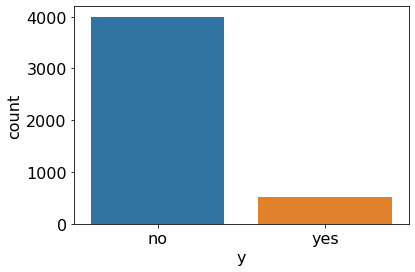

In [43]:
sns.countplot(bank_df.y) # Imbalance Class Target Variable

In [44]:
########################### Random Over Sampling
# class count
class_count_0, class_count_1 = bank_df['y'].value_counts()

# Separate class
class_0 = bank_df[bank_df['y'] == "no"]
class_1 = bank_df[bank_df['y'] == "yes"]

In [45]:
print('class 0:', class_0.shape) # Classes
print('class 1:', class_1.shape)

class 0: (4000, 17)
class 1: (521, 17)


total class of 1 and 0: yes    4000
no     4000
Name: y, dtype: int64


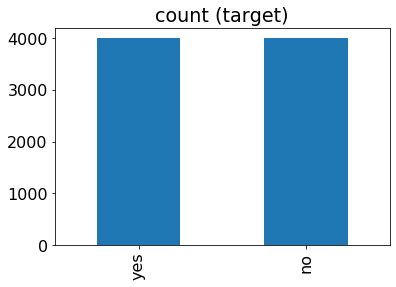

In [46]:
class_1_over = class_1.sample(class_count_0, replace=True)

test_over = pd.concat([class_1_over, class_0], axis=0)

print("total class of 1 and 0:",test_over['y'].value_counts())# plot the count after Over-sampeling
test_over['y'].value_counts().plot(kind='bar', title='count (target)')

In [47]:
cat_feature = [feature for feature in test_over.columns if test_over[feature].dtypes == 'O'] # Categorical

In [48]:
for feature in cat_feature:
    coder = LabelEncoder()
    test_over[feature]=coder.fit_transform(test_over[feature]) # Label Encoder

In [49]:
X = test_over.drop('y',1) # Independent Variable
y = test_over.y # Dependent Variable

In [50]:
scaler = StandardScaler() # Scaler

In [51]:
X = scaler.fit_transform(X) 

In [52]:
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.33, random_state=42)

## Modeling : Random Forest

In [53]:
rf_model = RandomForestClassifier(class_weight="balanced",random_state=40)  # Random Forest

In [54]:
rf_model.fit(X_train,y_train) # Model Fit

D:\Anaconda\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [55]:
y_pred = rf_model.predict(X_test) # Prediction

In [56]:
print(classification_report(y_test,y_pred,target_names=["Yes","No"])) # Classification Report

              precision    recall  f1-score   support

         Yes       0.99      0.94      0.97      1325
          No       0.94      0.99      0.97      1315

    accuracy                           0.97      2640
   macro avg       0.97      0.97      0.97      2640
weighted avg       0.97      0.97      0.97      2640



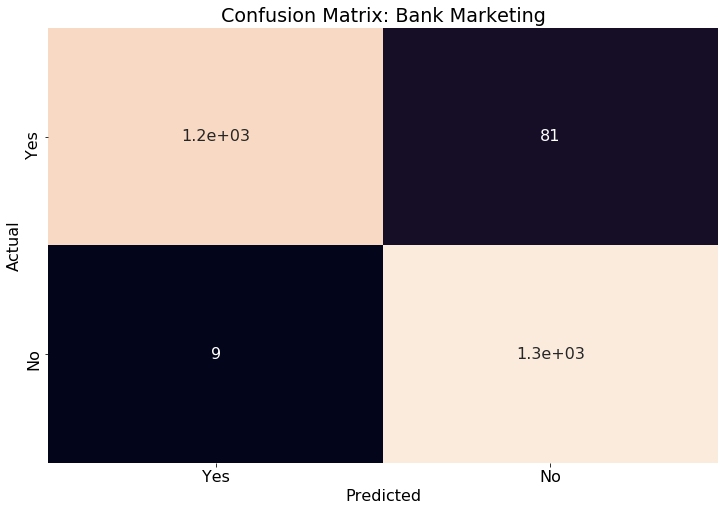

In [57]:
plt.figure(figsize=(12,8))
sns_plot = sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,cbar=False,xticklabels=["Yes","No"],yticklabels=["Yes","No"])
plt.title("Confusion Matrix: Bank Marketing")
plt.xlabel("Predicted")
plt.ylabel("Actual")
fig = sns_plot.get_figure()
fig.savefig("output_2.png")
plt.show()

In [58]:
print(confusion_matrix(y_test,y_pred)) # Confusion Matrix

[[1244   81]
 [   9 1306]]


In [59]:
print(accuracy_score(y_test,y_pred)) # Test Accuracy

0.9659090909090909


In [60]:
rf_model.score(X_train,y_train) # Train Accuracy

0.9988805970149254

Recall Baseline: 1.0 Test: 0.99 Train: 1.0
Precision Baseline: 0.5 Test: 0.94 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0


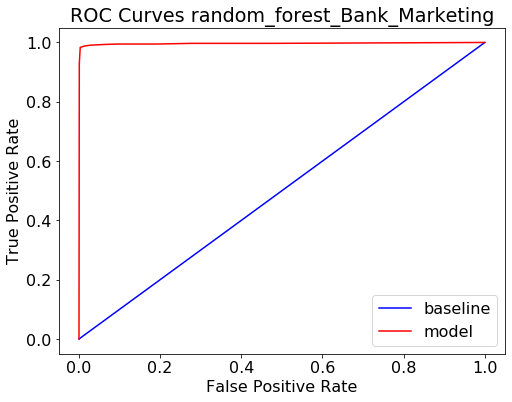

In [61]:
train_probs = rf_model.predict_proba(X_train)[:,1] 
probs = rf_model.predict_proba(X_test)[:,1]
train_predictions = rf_model.predict(X_train)

evaluate_model(y_pred,probs,train_predictions,train_probs,"random_forest_Bank_Marketing") ## ROC Curve

### Decision Tree: Multiclass Dataset

In [62]:
X_train_new = pd.DataFrame(X_train,columns=test_over.drop("y",1).columns) # Data Preparation
X_test_new = pd.DataFrame(X_test,columns=test_over.drop("y",1).columns) 

In [63]:
# Preparing Data for Multiclass Decision Tree
pred_prob = rf_model.predict_proba(X_train_new)

X_train_new['class_0'] =pred_prob[:,0]
X_train_new['class_1'] =pred_prob[:,1]



X_train_new['new_y'] = X_train_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)

X_train_new.drop(['class_0','class_1'],1,inplace=True)

pred_prob = rf_model.predict_proba(X_test)

X_test_new['class_0'] =pred_prob[:,0]
X_test_new['class_1'] =pred_prob[:,1]



X_test_new['new_y'] = X_test_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)

X_test_new.drop(['class_0','class_1'],1,inplace=True)
# Label Encoding for Training and testing 
for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_train_new[feature]=coder.fit_transform(X_train_new[feature])

for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_test_new[feature]=coder.fit_transform(X_test_new[feature])
# Feature Scaling
scaler = StandardScaler()

X = scaler.fit_transform(X_train_new.drop('new_y',1))

In [64]:
d_tree = DecisionTreeClassifier() # Decision Tree classifier

d_tree.fit(X,X_train_new.new_y)

scaler = StandardScaler()

x = scaler.fit_transform(X_test_new.drop('new_y',1))

d_pred = d_tree.predict(x) 

In [65]:
print(classification_report(X_test_new.new_y,d_pred)) # Classification report for Multiclass

              precision    recall  f1-score   support

           0       0.89      0.79      0.84      1221
           1       0.77      0.72      0.75        76
           2       0.86      0.32      0.46        19
           3       1.00      0.04      0.08        25
           4       0.18      0.07      0.10        46
           5       0.22      0.04      0.07        46
           6       0.00      0.00      0.00        41
           7       0.12      0.11      0.11        85
           8       0.14      0.15      0.14       119
           9       0.20      0.23      0.22       250
          10       0.66      0.85      0.74       712

    accuracy                           0.65      2640
   macro avg       0.46      0.30      0.32      2640
weighted avg       0.66      0.65      0.65      2640



In [66]:
accuracy_score(X_test_new.new_y.values,d_pred) # Accuracy on Testing Data

0.6530303030303031

In [67]:
d_tree.score(X,X_train_new.new_y)

1.0

### Hyper Parameter Tunning

In [68]:
grid=GridSearchCV(DecisionTreeClassifier(),param_grid,n_jobs=-1,cv=25,verbose=200) # Hyperparameter Tunning
grid.fit(X,X_train_new.new_y)

Fitting 25 folds for each of 1800 candidates, totalling 45000 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(514

D:\Anaconda\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 3 members, which is too few. The minimum number of members in any class cannot be less than n_splits=25.
  % (min_groups, self.n_splits)), Warning)


Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(2

[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.5s

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(2

[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 572 tasks      | elapsed:    2.1s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32)

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:    2.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32

Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape

[Parallel(n_jobs=-1)]: Done 1004 tasks      | elapsed:    3.8s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 1112 tasks      | elapsed:    4.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1448 tasks      | elapsed:    5.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1640 tasks      | elapsed:    6.1s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1748 tasks      | elapsed:    6.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int3

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).[Parallel(n_jobs=-1)]: Done 1856 tasks      | elapsed:    6.9s

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1868 tasks      | elapsed:    7.0s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=

[Parallel(n_jobs=-1)]: Done 1964 tasks      | elapsed:    7.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2072 tasks      | elapsed:    7.8s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2204 tasks      | elapsed:    8.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2312 tasks      | elapsed:    8.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2408 tasks      | elapsed:    9.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2504 tasks      | elapsed:   10.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 2600 tasks      | elapsed:   10.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2888 tasks      | elapsed:   12.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3164 tasks      | elapsed:   15.0s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 3332 tasks      | elapsed:   16.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3416 tasks      | elapsed:   17.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3512 tasks      | elapsed:   17.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3608 tasks      | elapsed:   18.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3704 tasks      | elapsed:   19.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3800 tasks      | elapsed:   19.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3896 tasks      | elapsed:   20.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int3

[Parallel(n_jobs=-1)]: Done 3992 tasks      | elapsed:   21.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int3

[Parallel(n_jobs=-1)]: Done 4088 tasks      | elapsed:   22.0s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4280 tasks      | elapsed:   23.4s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32

[Parallel(n_jobs=-1)]: Done 4388 tasks      | elapsed:   24.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 4484 tasks      | elapsed:   24.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4580 tasks      | elapsed:   25.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).[Parallel(n_jobs=-1)]: Done 4592 tasks      | elapsed:   25.9s

Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(

[Parallel(n_jobs=-1)]: Done 4676 tasks      | elapsed:   26.8s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 4844 tasks      | elapsed:   28.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int3

[Parallel(n_jobs=-1)]: Done 4940 tasks      | elapsed:   29.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 5144 tasks      | elapsed:   31.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).[Parallel(n_jobs=-1)]: Done 5156 tasks      | elapsed:   31.7s

Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=

[Parallel(n_jobs=-1)]: Done 5240 tasks      | elapsed:   32.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 5336 tasks      | elapsed:   33.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 5432 tasks      | elapsed:   34.4s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).[Parallel(n_jobs=-1)]: Done 5444 tasks      | elapsed:   34.4s

Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 5612 tasks      | elapsed:   35.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape

[Parallel(n_jobs=-1)]: Done 5912 tasks      | elapsed:   38.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 6008 tasks      | elapsed:   39.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6092 tasks      | elapsed:   40.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 6296 tasks      | elapsed:   42.1s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6392 tasks      | elapsed:   43.0s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int3

Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 6488 tasks      | elapsed:   43.9s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32

[Parallel(n_jobs=-1)]: Done 6584 tasks      | elapsed:   44.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6680 tasks      | elapsed:   45.5s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6764 tasks      | elapsed:   46.2s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6860 tasks      | elapsed:   47.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 6968 tasks      | elapsed:   48.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int3

Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shap

Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 7160 tasks      | elapsed:   50.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7256 tasks      | elapsed:   51.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7352 tasks      | elapsed:   52.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7448 tasks      | elapsed:   53.8s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7544 tasks      | elapsed:   54.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7640 tasks      | elapsed:   55.7s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7736 tasks      | elapsed:   56.6s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7820 tasks      | elapsed:   57.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int3

[Parallel(n_jobs=-1)]: Done 7916 tasks      | elapsed:   58.4s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 8012 tasks      | elapsed:   59.3s
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 8108 tasks      | elapsed:  1.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 8300 tasks      | elapsed:  1.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int3

[Parallel(n_jobs=-1)]: Done 8396 tasks      | elapsed:  1.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int3

[Parallel(n_jobs=-1)]: Done 8492 tasks      | elapsed:  1.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 8876 tasks      | elapsed:  1.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 8984 tasks      | elapsed:  1.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 9164 tasks      | elapsed:  1.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

[Parallel(n_jobs=-1)]: Done 9260 tasks      | elapsed:  1.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int3

[Parallel(n_jobs=-1)]: Done 9344 tasks      | elapsed:  1.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int3

[Parallel(n_jobs=-1)]: Done 9440 tasks      | elapsed:  1.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 9632 tasks      | elapsed:  1.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 9932 tasks      | elapsed:  1.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int3

[Parallel(n_jobs=-1)]: Done 10028 tasks      | elapsed:  1.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 10124 tasks      | elapsed:  1.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 10208 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 10304 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 10400 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 10496 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 10592 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 10796 tasks      | elapsed:  1.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 10880 tasks      | elapsed:  1.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 11132 tasks      | elapsed:  1.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 11312 tasks      | elapsed:  1.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 11600 tasks      | elapsed:  1.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 11792 tasks      | elapsed:  1.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 11888 tasks      | elapsed:  1.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 12188 tasks      | elapsed:  1.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 12284 tasks      | elapsed:  1.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 12380 tasks      | elapsed:  1.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 12488 tasks      | elapsed:  1.7min
Pi

[Parallel(n_jobs=-1)]: Done 12572 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 12656 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 12752 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 12848 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 12956 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 13052 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 13148 tasks      | elapsed:  1.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 13244 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 13340 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int3

[Parallel(n_jobs=-1)]: Done 13424 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 13520 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 13616 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int3

Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 13700 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 13808 tasks      | elapsed:  1.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 13904 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 13988 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 14084 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 14180 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 14276 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 14372 tasks      | elapsed:  2.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 14480 tasks      | elapsed:  2.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 14564 tasks      | elapsed:  2.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 14672 tasks      | elapsed:  2.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 14864 tasks      | elapsed:  2.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 14960 tasks      | elapsed:  2.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 15056 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 15152 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 15164 tasks      | elapsed:  2.2min
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 15248 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 15344 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).[Parallel(n_jobs=-1)]: Done 15356 tasks      | elapsed:  2.2min

Pickling array (shap

[Parallel(n_jobs=-1)]: Done 15440 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 15536 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 15632 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 15728 tasks      | elapsed:  2.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 15812 tasks      | elapsed:  2.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 15908 tasks      | elapsed:  2.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 16004 tasks      | elapsed:  2.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 16100 tasks      | elapsed:  2.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 16196 tasks      | elapsed:  2.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 16292 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 16388 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 16472 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 16568 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 16760 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 16844 tasks      | elapsed:  2.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 17036 tasks      | elapsed:  2.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 17300 tasks      | elapsed:  2.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 17384 tasks      | elapsed:  2.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 17564 tasks      | elapsed:  2.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 17768 tasks      | elapsed:  2.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 18056 tasks      | elapsed:  2.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18152 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18248 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 18332 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18428 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18524 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 18632 tasks      | elapsed:  2.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18728 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 18824 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 18908 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 19004 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 19100 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 19196 tasks      | elapsed:  2.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 19280 tasks      | elapsed:  2.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 19388 tasks      | elapsed:  2.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 19484 tasks      | elapsed:  2.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 19568 tasks      | elapsed:  2.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 19664 tasks      | elapsed:  2.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array 

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 19940 tasks      | elapsed:  3.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 20132 tasks      | elapsed:  3.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 20228 tasks      | elapsed:  3.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 20312 tasks      | elapsed:  3.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 20408 tasks      | elapsed:  3.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 20600 tasks      | elapsed:  3.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 20804 tasks      | elapsed:  3.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 20900 tasks      | elapsed:  3.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 20996 tasks      | elapsed:  3.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 21092 tasks      | elapsed:  3.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 21188 tasks      | elapsed:  3.2min
Pickling array (shape=(5360, 16), dtype=float64).[Parallel(n_jobs=-1)]: Done 21200 tasks      | elapsed:  3.2min

Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 21284 tasks      | elapsed:  3.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 21572 tasks      | elapsed:  3.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 21668 tasks      | elapsed:  3.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 21968 tasks      | elapsed:  3.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 22064 tasks      | elapsed:  3.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 22148 tasks      | elapsed:  3.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 22256 tasks      | elapsed:  3.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 22352 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 22448 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 22532 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
[Parallel(n_jobs=-1)]

[Parallel(n_jobs=-1)]: Done 22700 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 22796 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 22892 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 22988 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 23180 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 23276 tasks      | elapsed:  3.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 23372 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 23468 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 23564 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 23660 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 23756 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 23852 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 23948 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 24128 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 24224 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 24416 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 24512 tasks      | elapsed:  3.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 24632 tasks      | elapsed:  3.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 24728 tasks      | elapsed:  3.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 24812 tasks      | elapsed:  3.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 24896 tasks      | elapsed:  3.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 25076 tasks      | elapsed:  3.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 25172 tasks      | elapsed:  3.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 25280 tasks      | elapsed:  3.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 25364 tasks      | elapsed:  3.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 25556 tasks      | elapsed:  3.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array 

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 26108 tasks      | elapsed:  3.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 26204 tasks      | elapsed:  3.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 26300 tasks      | elapsed:  3.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 26396 tasks      | elapsed:  3.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 26492 tasks      | elapsed:  3.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 26588 tasks      | elapsed:  3.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 26768 tasks      | elapsed:  4.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 26852 tasks      | elapsed:  4.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 27044 tasks      | elapsed:  4.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 27128 tasks      | elapsed:  4.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 27224 tasks      | elapsed:  4.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 27308 tasks      | elapsed:  4.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 27392 tasks      | elapsed:  4.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 27488 tasks      | elapsed:  4.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 27584 tasks      | elapsed:  4.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 27680 tasks      | elapsed:  4.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 27776 tasks      | elapsed:  4.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 27872 tasks      | elapsed:  4.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 27968 tasks      | elapsed:  4.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 28064 tasks      | elapsed:  4.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 28160 tasks      | elapsed:  4.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 28244 tasks      | elapsed:  4.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 28340 tasks      | elapsed:  4.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 28436 tasks      | elapsed:  4.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 28532 tasks      | elapsed:  4.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 28628 tasks      | elapsed:  4.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 28724 tasks      | elapsed:  4.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 28820 tasks      | elapsed:  4.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 28916 tasks      | elapsed:  4.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shap

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 29204 tasks      | elapsed:  4.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 29300 tasks      | elapsed:  4.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 29396 tasks      | elapsed:  4.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 29492 tasks      | elapsed:  4.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 29576 tasks      | elapsed:  4.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 29684 tasks      | elapsed:  4.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 29780 tasks      | elapsed:  4.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 29876 tasks      | elapsed:  4.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 29972 tasks      | elapsed:  4.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 30068 tasks      | elapsed:  4.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 30164 tasks      | elapsed:  4.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 30260 tasks      | elapsed:  4.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 30356 tasks      | elapsed:  4.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 30452 tasks      | elapsed:  4.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 30560 tasks      | elapsed:  5.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 30656 tasks      | elapsed:  5.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 30752 tasks      | elapsed:  5.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 30848 tasks      | elapsed:  5.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 30944 tasks      | elapsed:  5.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 31040 tasks      | elapsed:  5.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 31124 tasks      | elapsed:  5.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 31220 tasks      | elapsed:  5.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 31316 tasks      | elapsed:  5.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 31400 tasks      | elapsed:  5.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 31496 tasks      | elapsed:  5.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 31592 tasks      | elapsed:  5.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 31688 tasks      | elapsed:  5.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 31784 tasks      | elapsed:  5.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 31880 tasks      | elapsed:  5.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 31976 tasks      | elapsed:  5.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 32072 tasks      | elapsed:  5.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 32168 tasks      | elapsed:  5.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 32252 tasks      | elapsed:  5.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 32336 tasks      | elapsed:  5.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 32432 tasks      | elapsed:  5.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 32528 tasks      | elapsed:  5.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 32612 tasks      | elapsed:  5.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 32696 tasks      | elapsed:  5.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 32948 tasks      | elapsed:  5.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 33044 tasks      | elapsed:  5.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 33140 tasks      | elapsed:  5.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 33236 tasks      | elapsed:  5.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 33440 tasks      | elapsed:  5.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 33620 tasks      | elapsed:  5.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 33884 tasks      | elapsed:  5.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 33980 tasks      | elapsed:  5.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 34064 tasks      | elapsed:  5.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 34172 tasks      | elapsed:  5.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 34268 tasks      | elapsed:  6.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 34364 tasks      | elapsed:  6.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 34460 tasks      | elapsed:  6.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 34556 tasks      | elapsed:  6.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 34652 tasks      | elapsed:  6.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 34748 tasks      | elapsed:  6.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 34844 tasks      | elapsed:  6.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 34940 tasks      | elapsed:  6.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 35036 tasks      | elapsed:  6.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 35132 tasks      | elapsed:  6.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 35228 tasks      | elapsed:  6.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 35324 tasks      | elapsed:  6.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int3

[Parallel(n_jobs=-1)]: Done 35396 tasks      | elapsed:  6.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 35492 tasks      | elapsed:  6.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 35588 tasks      | elapsed:  6.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 35684 tasks      | elapsed:  6.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 35780 tasks      | elapsed:  6.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 35876 tasks      | elapsed:  6.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 35972 tasks      | elapsed:  6.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 36140 tasks      | elapsed:  6.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 36236 tasks      | elapsed:  6.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 36332 tasks      | elapsed:  6.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 36428 tasks      | elapsed:  6.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 36524 tasks      | elapsed:  6.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 36620 tasks      | elapsed:  6.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 36704 tasks      | elapsed:  6.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 36788 tasks      | elapsed:  6.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 36884 tasks      | elapsed:  6.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 36980 tasks      | elapsed:  6.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 37076 tasks      | elapsed:  6.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 37172 tasks      | elapsed:  6.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 37268 tasks      | elapsed:  6.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 37448 tasks      | elapsed:  6.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 37544 tasks      | elapsed:  6.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 37640 tasks      | elapsed:  6.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 37820 tasks      | elapsed:  6.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 37916 tasks      | elapsed:  6.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 38012 tasks      | elapsed:  7.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 38096 tasks      | elapsed:  7.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

[Parallel(n_jobs=-1)]: Done 38192 tasks      | elapsed:  7.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 38288 tasks      | elapsed:  7.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 38384 tasks      | elapsed:  7.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 38492 tasks      | elapsed:  7.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 38576 tasks      | elapsed:  7.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 38672 tasks      | elapsed:  7.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 38840 tasks      | elapsed:  7.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 38924 tasks      | elapsed:  7.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 39020 tasks      | elapsed:  7.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 39116 tasks      | elapsed:  7.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 39212 tasks      | elapsed:  7.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 39380 tasks      | elapsed:  7.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 39476 tasks      | elapsed:  7.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 39656 tasks      | elapsed:  7.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 39752 tasks      | elapsed:  7.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 39920 tasks      | elapsed:  7.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 40004 tasks      | elapsed:  7.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 40100 tasks      | elapsed:  7.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 40196 tasks      | elapsed:  7.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 40292 tasks      | elapsed:  7.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 40376 tasks      | elapsed:  7.6min
Pi

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 40532 tasks      | elapsed:  7.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 40628 tasks      | elapsed:  7.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape

[Parallel(n_jobs=-1)]: Done 40820 tasks      | elapsed:  7.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 40916 tasks      | elapsed:  7.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 41024 tasks      | elapsed:  7.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int

[Parallel(n_jobs=-1)]: Done 41120 tasks      | elapsed:  7.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 41216 tasks      | elapsed:  7.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 41312 tasks      | elapsed:  7.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 41408 tasks      | elapsed:  7.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

[Parallel(n_jobs=-1)]: Done 41504 tasks      | elapsed:  7.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 41588 tasks      | elapsed:  8.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 41756 tasks      | elapsed:  8.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 41840 tasks      | elapsed:  8.0min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 41948 tasks      | elapsed:  8.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 42044 tasks      | elapsed:  8.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 42140 tasks      | elapsed:  8.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 42236 tasks      | elapsed:  8.1min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 42332 tasks      | elapsed:  8.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 42428 tasks      | elapsed:  8.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 42524 tasks      | elapsed:  8.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 42620 tasks      | elapsed:  8.2min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 42716 tasks      | elapsed:  8.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 42812 tasks      | elapsed:  8.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 42908 tasks      | elapsed:  8.3min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array 

Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 43076 tasks      | elapsed:  8.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int

Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 43172 tasks      | elapsed:  8.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 43268 tasks      | elapsed:  8.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 43352 tasks      | elapsed:  8.4min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 43436 tasks      | elapsed:  8.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 43532 tasks      | elapsed:  8.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 43628 tasks      | elapsed:  8.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 43724 tasks      | elapsed:  8.5min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 43820 tasks      | elapsed:  8.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 43916 tasks      | elapsed:  8.6min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array 

Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array 

[Parallel(n_jobs=-1)]: Done 44168 tasks      | elapsed:  8.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int

[Parallel(n_jobs=-1)]: Done 44252 tasks      | elapsed:  8.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 44348 tasks      | elapsed:  8.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 44444 tasks      | elapsed:  8.7min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int

[Parallel(n_jobs=-1)]: Done 44540 tasks      | elapsed:  8.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5148,), dtype=int32).
Pickling array (shape=(212,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int

[Parallel(n_jobs=-1)]: Done 44624 tasks      | elapsed:  8.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

[Parallel(n_jobs=-1)]: Done 44732 tasks      | elapsed:  8.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 44828 tasks      | elapsed:  8.8min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int32).
Pickling array (shape=(214,), dtype=int32).
Pickling array (shape=(5146,), dtype=int

[Parallel(n_jobs=-1)]: Done 44924 tasks      | elapsed:  8.9min
Pickling array (shape=(5360, 16), dtype=float64).
Pickling array (shape=(5360,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5149,), dtype=int32).
Pickling array (shape=(211,), dtype=int32).
Pickling array (shape=(5150,), dtype=int32).
Pickling array (shape=(210,), dtype=int32).
Pickling array (shape=(5139,), dtype=int32).
Pickling array (shape=(221,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5140,), dtype=int32).
Pickling array (shape=(220,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5141,), dtype=int32).
Pickling array (shape=(219,), dtype=int32).
Pickling array (shape=(5143,), dtype=int32).
Pickling array (shape=(217,), dtype=int32).
Pickling array (shape=(5143,), dtype=int

D:\Anaconda\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=25, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 7, 12, 17, 22, 27, 32, 37, 42, 47],


In [69]:
grid.best_params_

{'criterion': 'gini',
 'max_depth': 27,
 'min_samples_leaf': 2,
 'min_samples_split': 12}

In [70]:
grid.best_score_ # Accuracy after Hyperparameter tunning

0.798134328358209

### Decision Tree : Binary Classification

In [71]:
new_d_tree = DecisionTreeClassifier(**grid.best_params_) # Using Best Parameter 

new_d_tree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=17,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [72]:
new_d_tree.score(X_train,y_train)

0.9811567164179105

In [73]:
new_d_tree.score(X_test,y_test) # Testing Accuracy on Best Parameter Decision Tree on Base Data

0.9359848484848485

# 3rd Data Set

    age: continuous.
    workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
    fnlwgt: continuous.
    education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
    education-num: continuous.
    marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
    occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
    relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
    race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
    sex: Female, Male.
    capital-gain: continuous.
    capital-loss: continuous.
    hours-per-week: continuous.
    native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.


In [74]:
adult_df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
           names =['Age',"Workclass","Final_weight","Education","Education_num","Marital_status","Occupation","Relationship",
                   "Race","Sex","Capital_gain","Capital_loss","Hours_per_week","Native_county","Target"] )

In [75]:
adult_df.isna().sum() # Na Values

Age               0
Workclass         0
Final_weight      0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_county     0
Target            0
dtype: int64

In [76]:
adult_df.Target.value_counts() # Target Imbalance

 <=50K    24720
 >50K      7841
Name: Target, dtype: int64

In [112]:
adult_df.describe() # Univariate Analysis

,Age,Final_weight,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [78]:
##########################Over Sampling
# class count
class_count_0, class_count_1 = adult_df['Target'].value_counts()

# Separate class
class_0 = adult_df[adult_df['Target'] == " <=50K"]
class_1 = adult_df[adult_df['Target'] == " >50K"]

In [79]:
print('class 0:', class_0.shape)
print('class 1:', class_1.shape)

class 0: (24720, 15)
class 1: (7841, 15)


total class of 1 and 0:  >50K     24720
 <=50K    24720
Name: Target, dtype: int64


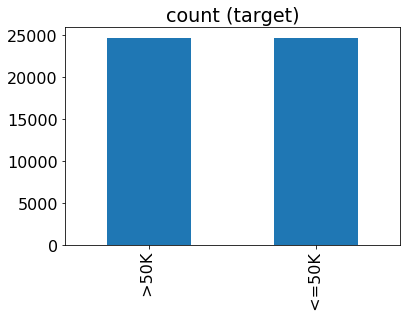

In [80]:
class_1_over = class_1.sample(class_count_0, replace=True) 

test_over = pd.concat([class_1_over, class_0], axis=0)

print("total class of 1 and 0:",test_over['Target'].value_counts())# plot the count after Over-sampeling
test_over['Target'].value_counts().plot(kind='bar', title='count (target)')

In [81]:
cat_feature = [feature for feature in test_over.columns if test_over[feature].dtypes == 'O'] # Categorical Feature
# Label Encoding
for feature in cat_feature:
    coder = LabelEncoder()
    test_over[feature]=coder.fit_transform(test_over[feature])

In [82]:
X = test_over.drop('Target',1) # Independent Feature
y = test_over.Target # Dependent Feature

In [83]:
scaler = StandardScaler() # Scaler

In [84]:
X = scaler.fit_transform(X)

In [85]:
# Splitting the Data
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.33, random_state=42)

### Modeling: Random Forest

In [86]:
rf_model = RandomForestClassifier(class_weight="balanced",random_state=40) # Random Forest

In [87]:
rf_model.fit(X_train,y_train)

D:\Anaconda\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [88]:
y_pred = rf_model.predict(X_test)

In [89]:
print(classification_report(y_test,y_pred,target_names=["<=50K",">50K"])) # Classification Report

              precision    recall  f1-score   support

       <=50K       0.95      0.89      0.92      8195
        >50K       0.89      0.96      0.92      8121

    accuracy                           0.92     16316
   macro avg       0.92      0.92      0.92     16316
weighted avg       0.92      0.92      0.92     16316



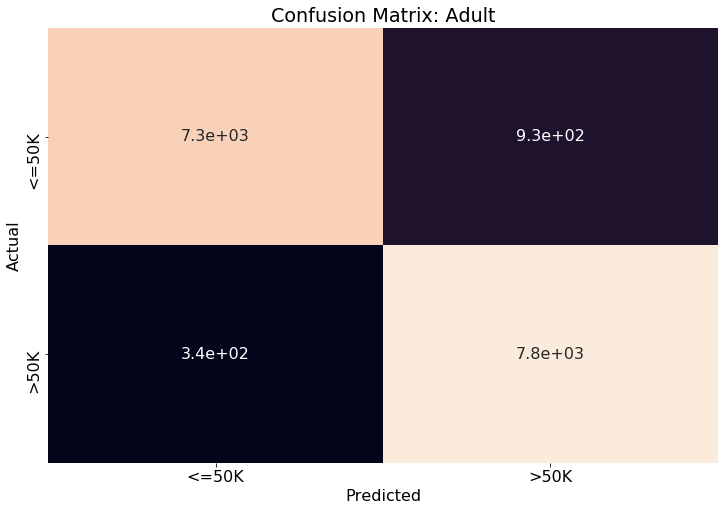

In [90]:
plt.figure(figsize=(12,8))
sns_plot = sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,cbar=False,xticklabels=["<=50K",">50K"],yticklabels=["<=50K",">50K"])
plt.title("Confusion Matrix: Adult")
plt.xlabel("Predicted")
plt.ylabel("Actual")
fig = sns_plot.get_figure()
fig.savefig("output_2.png")
plt.show()

In [91]:
print(confusion_matrix(y_test,y_pred)) # Confusion Matrix

[[7264  931]
 [ 344 7777]]


In [92]:
print(accuracy_score(y_test,y_pred)) # Test Accuracy

0.9218558470213287


In [93]:
rf_model.score(X_train,y_train) # Training Accuracy

0.9962866803526145

Recall Baseline: 1.0 Test: 0.96 Train: 1.0
Precision Baseline: 0.5 Test: 0.89 Train: 1.0
Roc Baseline: 0.5 Test: 0.97 Train: 1.0


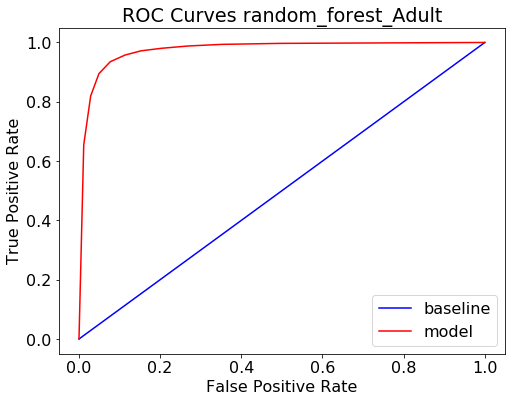

In [94]:
train_probs = rf_model.predict_proba(X_train)[:,1] 
probs = rf_model.predict_proba(X_test)[:,1]
train_predictions = rf_model.predict(X_train)

evaluate_model(y_pred,probs,train_predictions,train_probs,"random_forest_Adult") # ROC Curve

In [95]:
## Decision Tree

In [96]:
# Data Preparation
X_train_new = pd.DataFrame(X_train,columns=test_over.drop("Target",1).columns)
X_test_new = pd.DataFrame(X_test,columns=test_over.drop("Target",1).columns)

pred_prob = rf_model.predict_proba(X_train_new)

X_train_new['class_0'] =pred_prob[:,0]
X_train_new['class_1'] =pred_prob[:,1]



X_train_new['new_y'] = X_train_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)

X_train_new.drop(['class_0','class_1'],1,inplace=True)

pred_prob = rf_model.predict_proba(X_test)

X_test_new['class_0'] =pred_prob[:,0]
X_test_new['class_1'] =pred_prob[:,1]



X_test_new['new_y'] = X_test_new[['class_0','class_1']].astype('str').agg('-'.join, axis=1)

X_test_new.drop(['class_0','class_1'],1,inplace=True)

# Label Encoder
for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_train_new[feature]=coder.fit_transform(X_train_new[feature])

for feature in X_train_new.columns:
    coder = LabelEncoder()
    X_test_new[feature]=coder.fit_transform(X_test_new[feature])

# Standard Scaler
scaler = StandardScaler()

X = scaler.fit_transform(X_train_new.drop('new_y',1))

In [97]:
d_tree = DecisionTreeClassifier() # Decision Tree

### Decision Tree : Multiclass Classification

In [98]:
d_tree.fit(X,X_train_new.new_y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [99]:
scaler = StandardScaler()

x = scaler.fit_transform(X_test_new.drop('new_y',1)) # Scaling Test Data

In [100]:
d_pred = d_tree.predict(x)

In [101]:
print(classification_report(X_test_new.new_y,d_pred)) # Classification Report 

              precision    recall  f1-score   support

           0       0.84      0.93      0.88      5414
           1       0.70      0.72      0.71      1468
           2       0.62      1.00      0.77         5
           3       0.74      0.55      0.63       784
           4       0.66      0.39      0.49       555
           5       0.60      0.18      0.28       482
           6       0.36      0.11      0.17       437
           7       0.15      0.06      0.09       488
           8       0.16      0.09      0.12       591
           9       0.00      0.00      0.00       730
          10       0.12      0.06      0.08      1206
          11       0.25      0.08      0.12      4156
          12       0.00      0.00      0.00         0

    accuracy                           0.45     16316
   macro avg       0.40      0.32      0.33     16316
weighted avg       0.51      0.45      0.46     16316



D:\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
D:\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [102]:
accuracy_score(X_test_new.new_y.values,d_pred) # Accuracy before parameter tunning on Multiclass Decision Tree

0.45219416523657757

In [103]:
d_tree.score(X,X_train_new.new_y)

1.0

### Hyper Parameter Tunning

In [104]:
grid=GridSearchCV(DecisionTreeClassifier(),param_grid,n_jobs=-1,cv=30,verbose=200)  # Grid Search CV for Hyper Parameter tunning
grid.fit(X,X_train_new.new_y)

D:\Anaconda\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


Fitting 3 folds for each of 1800 candidates, totalling 5400 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
Memmapping (shape=(33124, 14), dtype=float64) to new file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling arra

Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtyp

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    1.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    1.5s
Memmapping (shape=(33124, 14), dtype

[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    2.3s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done  98 tasks      | elapsed:    2.3s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 100 task

[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    3.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    3.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 140 task

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    4.0s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 186 tasks      | elapsed:    4.0s
Memmapping (shape=(33124, 14), dtype

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    4.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:    4.6s
Memmapping (shape=(33124, 14), dtype

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    5.3s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    5.3s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtyp

[Parallel(n_jobs=-1)]: Done 288 tasks      | elapsed:    6.2s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 290 tasks      | elapsed:    6.2s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 292 task

[Parallel(n_jobs=-1)]: Done 328 tasks      | elapsed:    7.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    7.5s

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 332 task

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 368 tasks      | elapsed:    8.8s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:    8.8s
Memmapping (shape=(33124, 14), dtype

[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:   10.0s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:   10.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:   10.1s
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shap

[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   11.2s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 440 tasks      | elapsed:   11.2s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 442 task

[Parallel(n_jobs=-1)]: Done 478 tasks      | elapsed:   12.4s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed:   12.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 482 task

[Parallel(n_jobs=-1)]: Done 518 tasks      | elapsed:   13.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 520 tasks      | elapsed:   13.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 522 task

[Parallel(n_jobs=-1)]: Done 558 tasks      | elapsed:   15.4s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:   15.4s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 562 task

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 598 tasks      | elapsed:   17.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:   17.2s
Memmapping (shape=(33124, 14), dtype

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 634 tasks      | elapsed:   18.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 636 tasks      | elapsed:   18.8s
Memmapping (shape=(33124, 14), dtype

[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:   20.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:   20.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 672 task

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 708 tasks      | elapsed:   22.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).[Parallel(n_jobs=-1)]: Done 710 tasks      | elapsed:   22.8s

Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Memmapping (shape=(33124, 14), dtype

[Parallel(n_jobs=-1)]: Done 746 tasks      | elapsed:   24.4s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 748 tasks      | elapsed:   24.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 750 task

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   26.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 786 tasks      | elapsed:   26.2s
Memmapping (shape=(33124, 14), dtype

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 822 tasks      | elapsed:   28.0s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 824 tasks      | elapsed:   28.2s
Memmapping (shape=(33124, 14), dtype

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 860 tasks      | elapsed:   30.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 862 tasks      | elapsed:   30.2s
Memmapping (shape=(33124, 14), dtype

[Parallel(n_jobs=-1)]: Done 898 tasks      | elapsed:   32.0s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 900 tasks      | elapsed:   32.2s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 902 task

[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed:   33.8s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed:   33.9s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 936 task

[Parallel(n_jobs=-1)]: Done 972 tasks      | elapsed:   35.8s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 974 tasks      | elapsed:   35.8s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 976 task

[Parallel(n_jobs=-1)]: Done 1012 tasks      | elapsed:   37.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1014 tasks      | elapsed:   37.7s
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1016 t

[Parallel(n_jobs=-1)]: Done 1052 tasks      | elapsed:   39.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1054 tasks      | elapsed:   39.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1056 t

[Parallel(n_jobs=-1)]: Done 1090 tasks      | elapsed:   41.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1092 tasks      | elapsed:   41.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1094 t

[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   43.4s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1130 tasks      | elapsed:   43.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1132 t

[Parallel(n_jobs=-1)]: Done 1162 tasks      | elapsed:   45.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1164 tasks      | elapsed:   45.7s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1166 t

[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed:   47.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed:   47.5s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1200 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   49.6s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1236 tasks      | elapsed:   49.8s
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1274 tasks      | elapsed:   52.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1276 tasks      | elapsed:   52.1s
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1308 tasks      | elapsed:   53.9s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1310 tasks      | elapsed:   54.0s
Memmapping (shape=(33124, 14), dty

Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1342 tasks      | elapsed:   55.9s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1344 tasks      | elapsed:   56.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dt

[Parallel(n_jobs=-1)]: Done 1376 tasks      | elapsed:   58.1s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1378 tasks      | elapsed:   58.3s
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1380 t

[Parallel(n_jobs=-1)]: Done 1412 tasks      | elapsed:  1.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1414 tasks      | elapsed:  1.0min
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1416 t

[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  1.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1452 tasks      | elapsed:  1.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1454 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1488 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1490 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 1522 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1524 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1526 t

[Parallel(n_jobs=-1)]: Done 1556 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1558 tasks      | elapsed:  1.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1560 t

[Parallel(n_jobs=-1)]: Done 1592 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1594 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1596 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1628 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1630 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 1662 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1664 tasks      | elapsed:  1.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1666 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1702 tasks      | elapsed:  1.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1704 tasks      | elapsed:  1.3min
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1736 tasks      | elapsed:  1.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1738 tasks      | elapsed:  1.3min
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1774 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 1814 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1816 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1818 t

[Parallel(n_jobs=-1)]: Done 1854 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1856 tasks      | elapsed:  1.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1858 t

[Parallel(n_jobs=-1)]: Done 1894 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1896 tasks      | elapsed:  1.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1898 t

[Parallel(n_jobs=-1)]: Done 1934 tasks      | elapsed:  1.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
[Parallel(n_jobs=-1)]: Done 1936 tasks      | elapsed:  1.5min
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 1974 tasks      | elapsed:  1.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 1976 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1978 t

[Parallel(n_jobs=-1)]: Done 2014 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 2016 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2018 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (s

[Parallel(n_jobs=-1)]: Done 2054 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2056 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2058 t

[Parallel(n_jobs=-1)]: Done 2094 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2096 tasks      | elapsed:  1.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 2134 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2136 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2138 t

[Parallel(n_jobs=-1)]: Done 2170 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2172 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2174 t

[Parallel(n_jobs=-1)]: Done 2206 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2208 tasks      | elapsed:  1.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2210 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2246 tasks      | elapsed:  1.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2282 tasks      | elapsed:  1.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2284 tasks      | elapsed:  1.8min
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2318 tasks      | elapsed:  1.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2320 tasks      | elapsed:  1.8min
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2354 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2356 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 2390 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2392 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2394 t

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2432 tasks      | elapsed:  1.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dt

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  2.0min

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2470 tasks      | elapsed:  2.0min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 2502 tasks      | elapsed:  2.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2504 tasks      | elapsed:  2.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2506 t

[Parallel(n_jobs=-1)]: Done 2538 tasks      | elapsed:  2.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2540 tasks      | elapsed:  2.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2542 t

[Parallel(n_jobs=-1)]: Done 2574 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2578 t

[Parallel(n_jobs=-1)]: Done 2614 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2616 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2618 t

[Parallel(n_jobs=-1)]: Done 2654 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2656 tasks      | elapsed:  2.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2658 t

[Parallel(n_jobs=-1)]: Done 2694 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2696 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2698 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2732 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2734 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dty

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2766 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2768 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dty

Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2804 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2806 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dt

Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2846 tasks      | elapsed:  2.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dt

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2884 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2886 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 2920 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2922 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2924 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2962 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2964 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 2996 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 2998 tasks      | elapsed:  2.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3000 t

[Parallel(n_jobs=-1)]: Done 3036 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3038 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3040 t

[Parallel(n_jobs=-1)]: Done 3076 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3078 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3080 t

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3112 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3114 tasks      | elapsed:  2.4min
Memmapping (shape=(33124, 14), dty

[Parallel(n_jobs=-1)]: Done 3146 tasks      | elapsed:  2.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3148 tasks      | elapsed:  2.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3150 t

[Parallel(n_jobs=-1)]: Done 3180 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3182 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3184 t

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3207 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3208 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3209 tasks      | elapsed:  2.6min
Memmapping (shape

[Parallel(n_jobs=-1)]: Done 3231 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3232 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3233 tasks      | elapsed:  2.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3253 tasks      | elapsed:  2.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl[Parallel(n_jobs=-1)]: Done 3254 tasks      | elapsed:  2.7min

Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3274 tasks      | elapsed:  2.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3275 tasks      | elapsed:  2.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3297 tasks      | elapsed:  2.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3298 tasks      | elapsed:  2.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3299 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3320 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3321 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3322 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3341 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3342 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3343 tasks      | elapsed:  2.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3365 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3366 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3388 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3389 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3390 tasks      | elapsed:  2.9min
Memmapping (shape

[Parallel(n_jobs=-1)]: Done 3409 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3410 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3411 tasks      | elapsed:  2.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3432 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3433 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3456 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3457 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3458 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3480 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3481 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3482 tasks      | elapsed:  3.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3505 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3506 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3526 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3527 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3548 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3549 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3550 tasks      | elapsed:  3.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3570 tasks      | elapsed:  3.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3571 tasks      | elapsed:  3.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3591 tasks      | elapsed:  3.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3592 tasks      | elapsed:  3.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3593 tasks      | elapsed:  3.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3612 tasks      | elapsed: 23.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3613 tasks      | elapsed: 23.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3614 tasks      | elapsed: 23.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3633 tasks      | elapsed: 23.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3634 tasks      | elapsed: 23.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3635 tasks      | elapsed: 23.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3657 tasks      | elapsed: 23.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3658 tasks      | elapsed: 23.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3680 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3681 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3701 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3702 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3703 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3723 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3724 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3725 tasks      | elapsed: 23.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3744 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3745 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3746 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3765 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3766 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3767 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3789 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3790 tasks      | elapsed: 23.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3811 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3812 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3813 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3833 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3834 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3835 tasks      | elapsed: 24.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3856 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3857 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3858 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3877 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3878 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3879 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3899 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3900 tasks      | elapsed: 24.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3920 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3921 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 3941 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3942 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3943 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3963 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3964 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3965 tasks      | elapsed: 24.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 3987 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3988 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 3989 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4008 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4009 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4010 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4031 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4032 tasks      | elapsed: 24.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 4055 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4056 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4057 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4079 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4080 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4081 tasks      | elapsed: 24.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4103 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4104 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4105 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4127 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4128 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4149 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4150 tasks      | elapsed: 24.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 4170 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4171 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4172 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4191 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4192 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4193 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4212 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4213 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4214 tasks      | elapsed: 24.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4235 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4236 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4237 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4256 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4257 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4258 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4280 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4281 tasks      | elapsed: 24.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4304 tasks      | elapsed: 24.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4305 tasks      | elapsed: 24.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4326 tasks      | elapsed: 24.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4327 tasks      | elapsed: 24.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4347 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4348 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 4368 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4369 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4370 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4392 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4393 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4394 tasks      | elapsed: 24.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4416 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4417 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4418 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4440 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4441 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4442 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4464 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4465 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4466 tasks      | elapsed: 25.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4488 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4489 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4490 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4512 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4513 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4514 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4536 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4537 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4538 tasks      | elapsed: 25.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4560 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4561 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4562 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4583 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4584 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4585 tasks      | elapsed: 25.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4605 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4606 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4607 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4627 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4628 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4629 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4651 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4652 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4653 tasks      | elapsed: 25.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4675 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4676 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4677 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4699 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4700 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4701 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4723 tasks      | elapsed: 25.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4724 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4725 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4747 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).[Parallel(n_jobs=-1)]: Done 4748 tasks      | elapsed: 25.5min

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4749 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4771 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4772 tasks      | elapsed: 25.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl[Parallel(n_jobs=-1)]: Done 4

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4795 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4796 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 4817 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4818 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4819 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4838 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4839 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4840 tasks      | elapsed: 25.6min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4861 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4862 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4863 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4885 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4886 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4887 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4908 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4909 tasks      | elapsed: 25.7min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 4929 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4930 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4931 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 4950 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4951 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4952 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4973 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4974 tasks      | elapsed: 25.8min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4997 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 4998 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5020 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5021 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5041 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5042 tasks      | elapsed: 25.9min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5043 tasks      | elapsed: 25.9min
Memmapping (shape

[Parallel(n_jobs=-1)]: Done 5062 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5063 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5064 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5083 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5084 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5085 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22078,), dtype=int32).
Pickling array (shape=(11046,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5106 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5107 tasks      | elapsed: 26.0min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124

[Parallel(n_jobs=-1)]: Done 5130 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5131 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5132 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5151 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5152 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5153 tasks      | elapsed: 26.1min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5175 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5176 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5177 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5199 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5200 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
[Parallel(n_jobs=-1)]: Done 5201 tasks      | elapsed: 26.2min
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5223 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5224 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5225 tasks      | elapsed: 26.2min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5247 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5248 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5249 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5271 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).[Parallel(n_jobs=-1)]: Done 5272 tasks      | elapsed: 26.3min

Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5273 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5295 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5296 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5297 tasks      | elapsed: 26.3min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5319 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5320 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5321 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5343 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5344 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5345 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5367 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5368 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5369 tasks      | elapsed: 26.4min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

[Parallel(n_jobs=-1)]: Done 5391 tasks      | elapsed: 26.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22083,), dtype=int32).
Pickling array (shape=(11041,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5392 tasks      | elapsed: 26.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65f5c04d7f2e481fbada7da555e29461.pkl
Pickling array (shape=(33124,), dtype=int32).
Pickling array (shape=(22087,), dtype=int32).
Pickling array (shape=(11037,), dtype=int32).
[Parallel(n_jobs=-1)]: Done 5393 tasks      | elapsed: 26.5min
Memmapping (shape=(33124, 14), dtype=float64) to old file C:\Users\DELL\AppData\Local\Temp\joblib_memmapping_folder_12584_7866746534\12584-2469594798176-65

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 7, 12, 17, 22, 27, 32, 37, 42, 47],
 

In [105]:
grid.best_params_

{'criterion': 'gini',
 'max_depth': 37,
 'min_samples_leaf': 2,
 'min_samples_split': 2}

In [106]:
grid.best_score_

0.6974097331240189

### Decision Tree: Binary Classification

In [107]:
new_d_tree = DecisionTreeClassifier(**grid.best_params_) # Using Best Parameters

In [108]:
new_d_tree.fit(X_train,y_train) # Fitting Model

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=11,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [109]:
new_d_tree.score(X_train,y_train)

0.861097693515276

In [110]:
new_d_tree.score(X_test,y_test) # Testing Data Accuracy

0.8433439568521697